# Гомография

1. Сделать панораму для более чем 2-х снимков.

## Панорама

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [76]:
def homography(img1, img2):

  # Преобразование изображений в оттенки серого
  gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
  gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

  # Инициализация объекта SIFT (определение ключевых точек)
  sift = cv2.xfeatures2d.SIFT_create()

  # Нахождение ключевых точек и дескрипторов на обоих изображениях
  kp1, des1 = sift.detectAndCompute(gray1, None)
  kp2, des2 = sift.detectAndCompute(gray2, None)

  # Нахождение соответствий между дескрипторами на двух изображениях
  matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
  matches = matcher.knnMatch(des1, des2, k=2)

  # Фильтрация соответствий с помощью метрики Lowe's ratio test
  good_matches = []
  for m, n in matches:
      if m.distance < 0.75 * n.distance:
          good_matches.append(m)

  # Нахождение матрицы гомографии
  src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
  H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

  return H

In [77]:
def add_images_for_panorama(img1, img2):
  h = homography(img1, img2)
  # Преобразование изображений
  panorama = cv2.warpPerspective(img1, h, (img1.shape[1] + img2.shape[1], img2.shape[0]))
  panorama[0:img2.shape[0], 0:img2.shape[1]] = img2

  return panorama

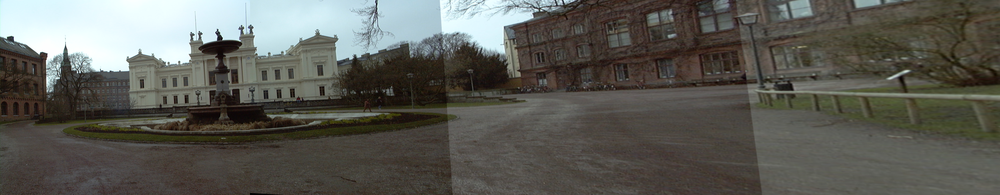

In [78]:
# Загрузка изображений
img1 = cv2.imread('data/Univ1.jpg')
img2 = cv2.imread('data/Univ2.jpg')
img3 = cv2.imread('data/Univ3.jpg')
img4 = cv2.imread('data/Univ4.jpg')
img5 = cv2.imread('data/Univ5.jpg')

# Создание панорамы

panorama = add_images_for_panorama(img1, img2)
panorama = add_images_for_panorama(panorama, img3)
panorama = add_images_for_panorama(panorama, img4)


# Отображение результата
cv2_imshow(panorama)

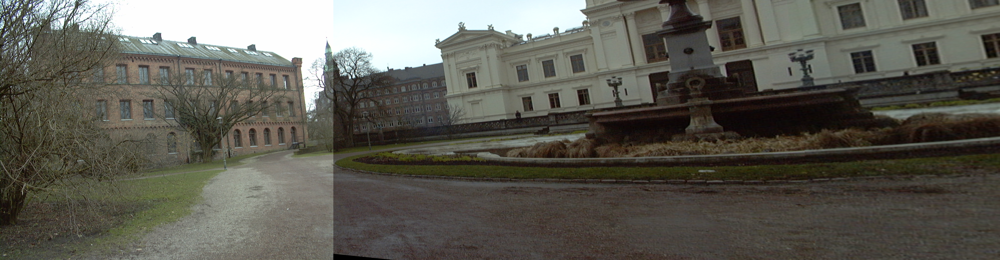

In [79]:
# Создание панорамы
panorama = add_images_for_panorama(img3, img4)
panorama = add_images_for_panorama(panorama, img5)

# Отображение результата
cv2_imshow(panorama)